## Raster data operations
Raster data is an imporant format of spatial data. In this tutorial, we are going to using Python to manipulate the raster data format. We will work with `RasterIO` and `Numpy` for the raster data processing. RasterIO is a modern library to work with geospatial data in a gridded format. It excels at providing an easy way to read/write raster data and access individual bands and pixels as numpy arrays.

`Rasterio` is built on top of the popular `GDAL` (Geospatial Data Abstraction Library). GDAL is written in C++ so the Python API provided by GDAL is not very intuitive for Python users. RaserIO aims to make it easy for Python users to use the underlying GDAL library in an intuitive way.

In this section, we will read and write raster data using `rasterio`.

### Prepare the Python modules

In [8]:
import os, os.path
import numpy as np
import rasterio as rio
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.windows import get_data_window
from rasterio.windows import Window
from rasterio.merge import merge
# optional - turn off warnings
import warnings
from matplotlib import pyplot as plt
warnings.filterwarnings('ignore')

### Read the raster data and get the metadata of the raster data

After running the notebook of `naip-downloader.ipynb`, you will download the NAIP tiles for Philadelphia. Then we can check the data and explore how to use Python to do analyses on the raster data. If you have difficulty to download the NAIP tiles, I provide one for you to download. 

In [9]:
naip_file = 'cir-naip/pa_m_4007562_ne_18_1_20170910_20171207.tif'
naip_dataset = rio.open(naip_file)
naip_bounds = naip_dataset.bounds
naip_bounds

BoundingBox(left=473049.0, bottom=4434424.0, right=479000.0, top=4441978.0)

In [11]:
naip_dataset.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 5951,
 'height': 7554,
 'count': 4,
 'crs': CRS.from_epsg(26918),
 'transform': Affine(1.0, 0.0, 473049.0,
        0.0, -1.0, 4441978.0)}

### Now we can read the geotiff image for different bands

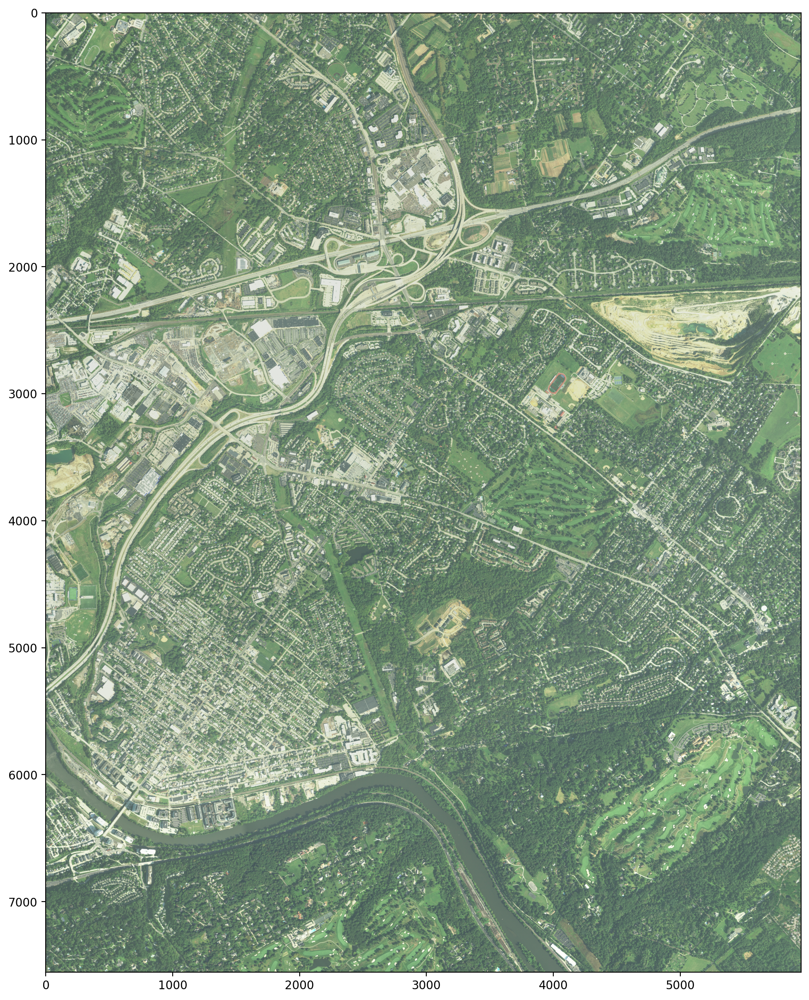

In [13]:
import numpy as np
from matplotlib import pyplot as plt

naip_file = 'cir-naip/pa_m_4007562_ne_18_1_20170910_20171207.tif'
naip_dataset = rio.open(naip_file)

# read the different bands of the raster data
nir = np.float32(naip_dataset.read(4))
blue = np.float32(naip_dataset.read(3))
green = np.float32(naip_dataset.read(2))
red = np.float32(naip_dataset.read(1))


# stack different layer images
cir = np.dstack((red,green,blue))


# plt.imshow(band1)
plt.figure(figsize=(15, 15), dpi=200)
plt.imshow(cir.astype(np.uint8))

### Display the NAIP image
Here is a function to resmaple the images for display. In some cases, we need to unsample raster data for visualization.

Resampling to 3777,2975


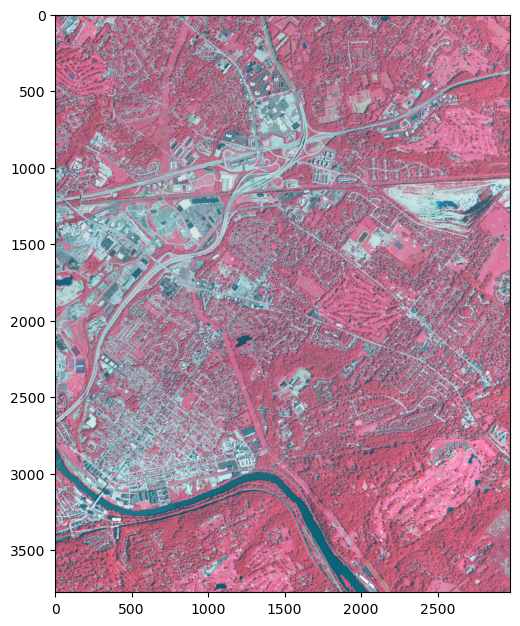

In [14]:
def display_naip_tile(filename, dsfactor = 2):
    """
    Display a NAIP tile using rasterio.
    
    dsfactor: downsample factor
    For .mrf-formatted tiles (which span multiple files), 'filename' should refer to the 
    .mrf file.
    """
    
    # NAIP tiles are enormous; downsize for plotting in this notebook
    
    with rasterio.open(filename) as raster:
        # rasterio uses 1-based indexing for channels.
        h = int(raster.height/dsfactor)
        w = int(raster.width/dsfactor)
        print('Resampling to {},{}'.format(h,w))
        ir = raster.read(4, out_shape=(1, h, w))
        r = raster.read(1, out_shape=(1, h, w))
        g = raster.read(2, out_shape=(1, h, w))
        
    cir = np.dstack((ir,r,g))
    fig = plt.figure(figsize=(7.5, 7.5), dpi=100, edgecolor='k')
    plt.imshow(cir)
    raster.close()
    
naip_file = 'cir-naip/pa_m_4007562_ne_18_1_20170910_20171207.tif'
display_naip_tile(naip_file)

### Calculate the NDVI from NAIP image

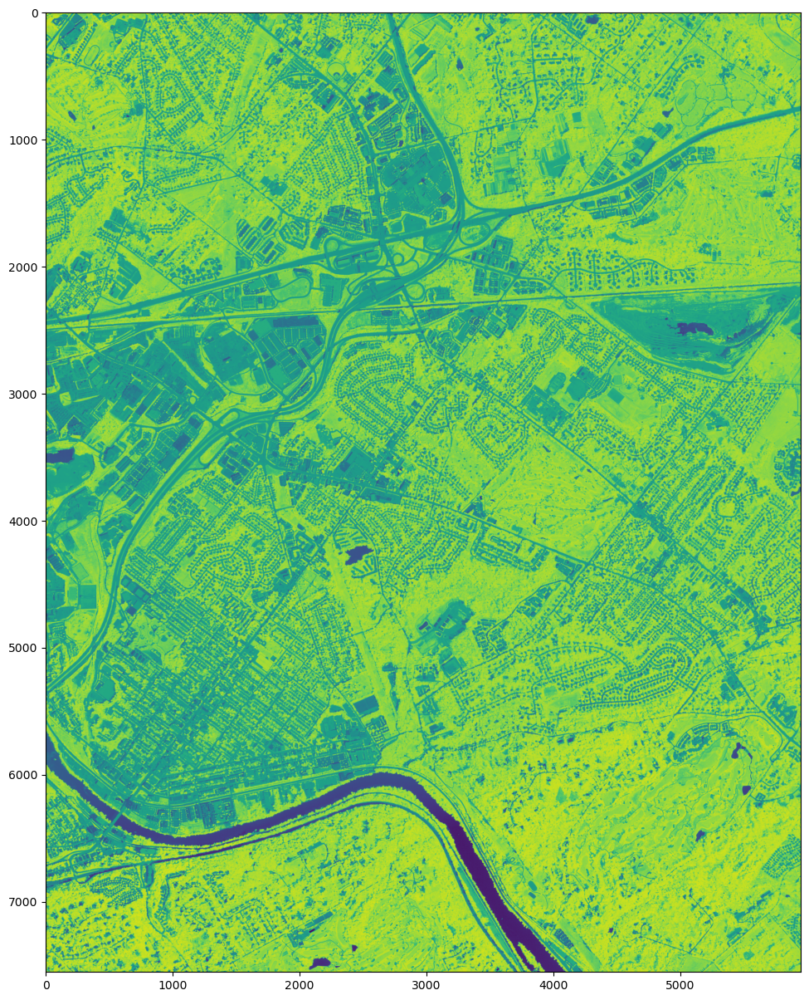

In [15]:
# here add 0.0000001 is to make sure the nir+red is not zero
ndvi = (nir - red)/(nir + red + 0.000001)

plt.figure(figsize=(15, 15))
plt.imshow(ndvi)

In [17]:
ndvi.

(7554, 5951)

In [18]:
# check the statistics of the calcualted NDVI images
ndvi.max()

0.5210356

### Extract vegetation from NAIP image
Since vegetation usually has larger reflectance in the near infrared band than the red band, therefore, we can calculate the NDVI and use the NDVI to extract the vegetation part. 

In [19]:
ndvi > 0

array([[False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

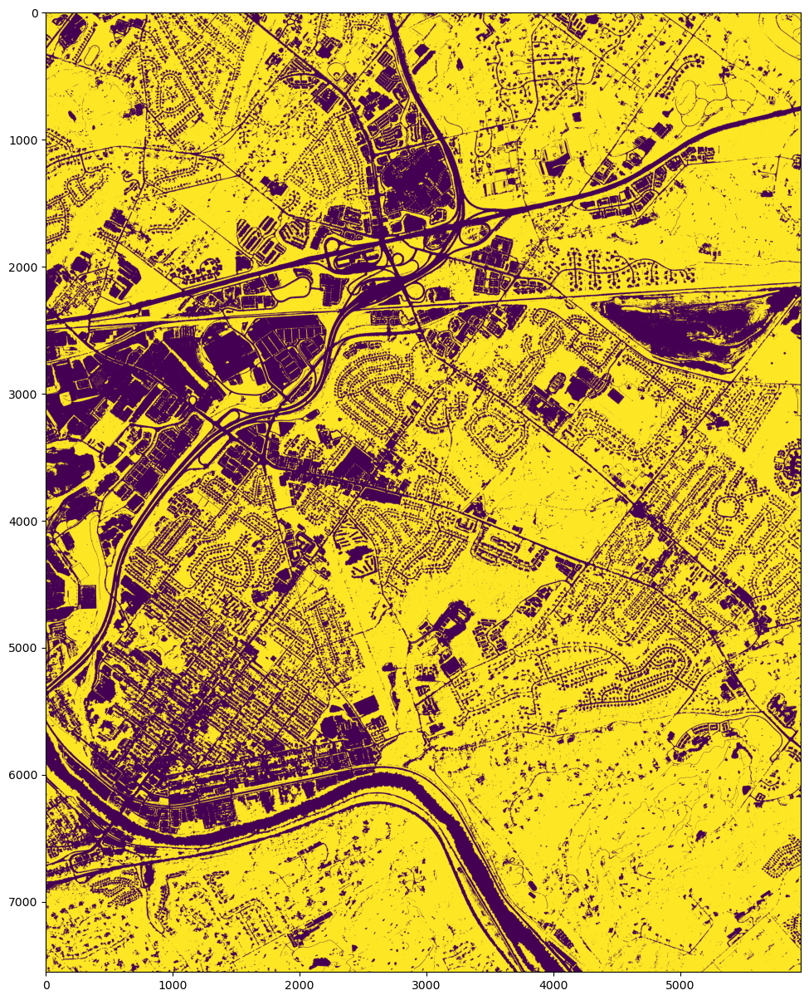

In [20]:
plt.figure(figsize=(15, 15))

veg = np.zeros((ndvi.shape[0], ndvi.shape[1]), dtype = np.uint8)
veg[ndvi > 0] = 1

plt.imshow(veg)

### Save raster data as a new tiff file
We can save our calculated vegetation cover map as a new geotiff file

In [21]:
out_tif = 'data/veg.tif'

# prepare the schema of the new tiles
out_meta = naip_dataset.meta.copy()


In [22]:
out_meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 5951,
 'height': 7554,
 'count': 4,
 'crs': CRS.from_epsg(26918),
 'transform': Affine(1.0, 0.0, 473049.0,
        0.0, -1.0, 4441978.0)}

In [23]:
veg.shape

(7554, 5951)

In [24]:

# update the schema of the ndvi image, because it is different from teh raw naip image, like only one band
out_meta.update({'count': 1,
                 'compress': 'lzw'}
               )

# this is required, because rio will use three dimension, even this is single band image
veg = veg.reshape(1, veg.shape[0], veg.shape[1])


In [25]:
veg.shape

(1, 7554, 5951)

In [26]:

with rio.open(out_tif, "w", **out_meta) as dest:
    dest.write(veg)
    